In [1]:
import torch
from math import pi
import einops as einops
from training.utils.FLAIR_2 import*
import matplotlib.pyplot as plt
from training.perceiver import*
from training.utils import*
from training.losses import*
from training.VIT import*
from training.ResNet import*
from collections import defaultdict
from training import*

from pytorch_lightning import Trainer,seed_everything
seed_everything(42, workers=True)

Seed set to 42


42

In [2]:
#config_path = "./data/flair_2_dataset/flair-2-config.yml" # Change to yours
config_path = "./data/flair_2_toy_dataset/flair-2-config.yml" # Change to yours
with open(config_path, "r") as f:
    config = yaml.safe_load(f)
    

In [3]:
# Creation of the train, val and test dictionnaries with the data file paths
d_train, d_val, d_test = load_data(config)

images = d_train["PATH_IMG"]
labels = d_train["PATH_LABELS"]
sentinel_images = d_train["PATH_SP_DATA"]
sentinel_masks = d_train["PATH_SP_MASKS"] # Cloud masks
sentinel_products = d_train["PATH_SP_DATES"] # Needed to get the dates of the sentinel images
centroids = d_train["SP_COORDS"] # Position of the aerial image in the sentinel super area
aerial_mtds=d_train["MTD_AERIAL"]



27
11
12


In [4]:
d_train.keys()

dict_keys(['PATH_IMG', 'PATH_SP_DATA', 'SP_COORDS', 'PATH_SP_DATES', 'PATH_SP_MASKS', 'PATH_LABELS', 'MTD_AERIAL'])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0725..4.927].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.146..2.934].


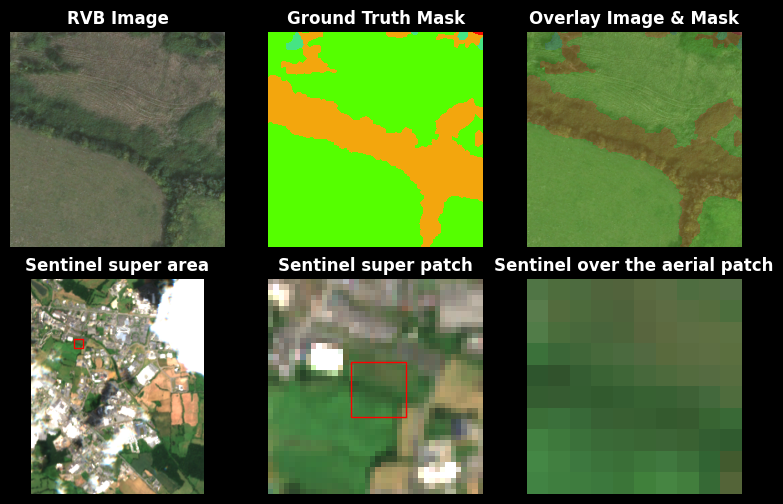

In [5]:
display_samples(images, labels, sentinel_images, centroids)

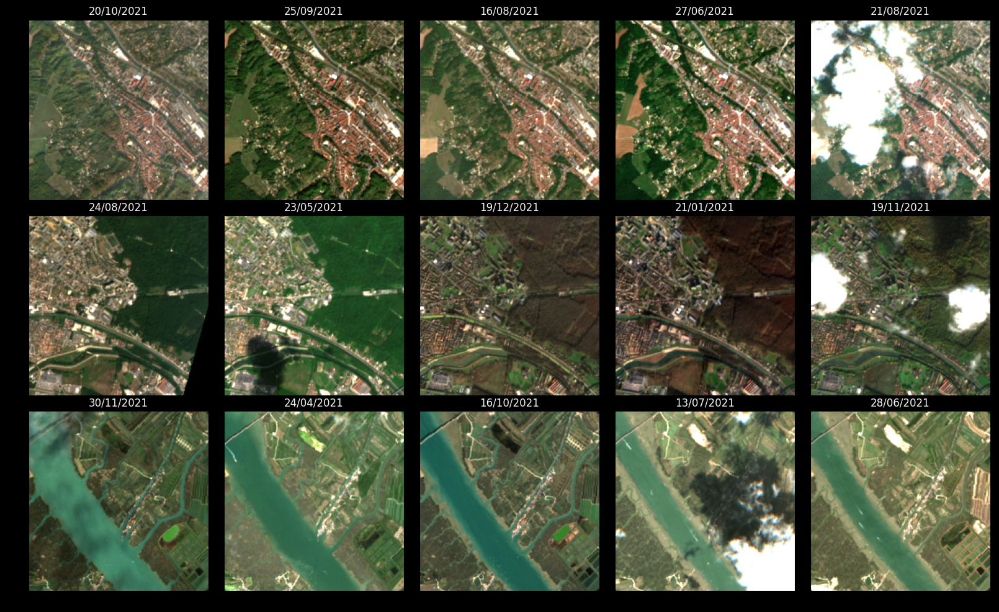

In [6]:
display_time_serie(sentinel_images, sentinel_masks, sentinel_products, nb_samples=3)

In [7]:
im,mk,sen_spatch,img_dates,sen_mask,aerial_mtd=get_sample(0,images, labels, sentinel_images, centroids,sentinel_products,sentinel_masks,aerial_mtds, palette=lut_colors)

In [8]:
dico_stats=compute_channel_mean_std(images, labels, sentinel_images, centroids,sentinel_products,sentinel_masks,aerial_mtds)

Median value: 46.0


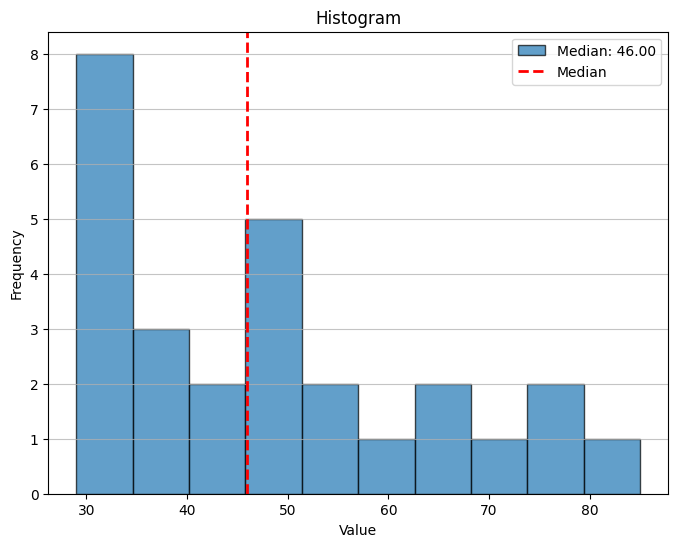

In [9]:


import numpy as np
import matplotlib.pyplot as plt

def plot_histogram(data, bins=10, title="Histogram", xlabel="Value", ylabel="Frequency"):
    median_value = np.median(data)  # Compute the median
    print(f"Median value: {median_value}")  # Print the median
    
    plt.figure(figsize=(8, 6))
    plt.hist(data, bins=bins, edgecolor='black', alpha=0.7, label=f"Median: {median_value:.2f}")
    plt.axvline(median_value, color='red', linestyle='dashed', linewidth=2, label="Median")
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.grid(axis='y', alpha=0.75)
    plt.legend()
    plt.show()


plot_histogram(dico_stats['times_series'])

In [10]:
create_dataset(images, labels, sentinel_images, centroids,sentinel_products,sentinel_masks,aerial_mtds, name="tiny", mode="train", stats=None)

In [11]:
config_model = read_yaml("./training/configs/config_test-Atomiser_Atos.yaml")
trans_config=transformations_config_flair("./data/bands_info/bands.yaml",config_model)

In [12]:
config_model

{'encoder': 'Atomiser',
 'dataset': {'batchsize': 1, 'classes': 13},
 'trainer': {'lr': '7e-4',
  'dropout': 0.5,
  'epochs': 100,
  'logging_step': 10,
  'num_classes': 13,
  'weight_decay': 0.0,
  'multi_modal': True,
  'max_tokens': 1310720},
 'wavelengths_encoding': {'gauss_1': {'mean': 380, 'std': 15},
  'gauss_2': {'mean': 424, 'std': 15},
  'gauss_3': {'mean': 468, 'std': 15},
  'gauss_4': {'mean': 513, 'std': 15},
  'gauss_5': {'mean': 557, 'std': 15},
  'gauss_6': {'mean': 602, 'std': 15},
  'gauss_7': {'mean': 646, 'std': 15},
  'gauss_8': {'mean': 691, 'std': 15},
  'gauss_9': {'mean': 735, 'std': 15},
  'gauss_10': {'mean': 780, 'std': 15},
  'gauss_11': {'mean': 2100, 'std': 120}},
 'Atomiser': {'depth': 8,
  'num_latents': 512,
  'latent_dim': 512,
  'cross_heads': 1,
  'latent_heads': 8,
  'cross_dim_head': 64,
  'latent_dim_head': 64,
  'attn_dropout': 0.0,
  'ff_dropout': 0.0,
  'weight_tie_layers': False,
  'fourier_encode_data': False,
  'self_per_cross_attn': 1,
  '

In [13]:
data_flair=CustomFLAIR(file_path="./data/custom_flair/tiny_train.h5",trans_config=trans_config)

len(data_flair)

1

In [14]:
labels=load_json_to_dict("./data/flair_2_toy_dataset/flair_labels.json")

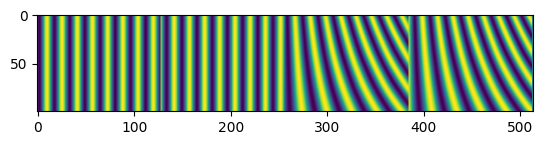

In [15]:
model=Model(config_model, wand=None, name="test_hoho",labels=labels,img_shape=None)
data_flair=CustomFLAIR(file_path="./data/custom_flair/tiny_train.h5",trans_config=trans_config)


In [16]:
CustomFlairDataModule("./data/bands_info/bands.yaml",config,trans_config, batch_size=8, num_workers=4)

Seed set to 42
GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/hugoriffaud/Documents/FLAIR_Ato/venv/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/logger_connector/logger_connector.py:76: Starting from v1.9.0, `tensorboardX` has been removed as a dependency of the `pytorch_lightning` package, due to potential conflicts with other packages in the ML ecosystem. For this reason, `logger=True` will use `CSVLogger` as the default logger, unless the `tensorboard` or `tensorboardX` packages are found. Please `pip install lightning[extra]` or one of them to enable TensorBoard support by default
/Users/hugoriffaud/Documents/FLAIR_Ato/venv/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints exists and is not empty.

  | Name             | Type                      | Params | Mode 
-----------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Validation DataLoader created on rank: 0


/Users/hugoriffaud/Documents/FLAIR_Ato/venv/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:420: Consider setting `persistent_workers=True` in 'val_dataloader' to speed up the dataloader worker initialization.


Train DataLoader created on rank: 0


/Users/hugoriffaud/Documents/FLAIR_Ato/venv/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:420: Consider setting `persistent_workers=True` in 'train_dataloader' to speed up the dataloader worker initialization.


Training: |          | 0/? [00:00<?, ?it/s]

Unique predicted classes: tensor([ 0,  1,  2,  4,  5,  6,  7,  8,  9, 10, 11, 12], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


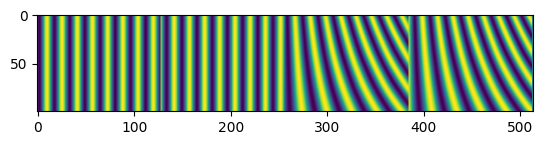

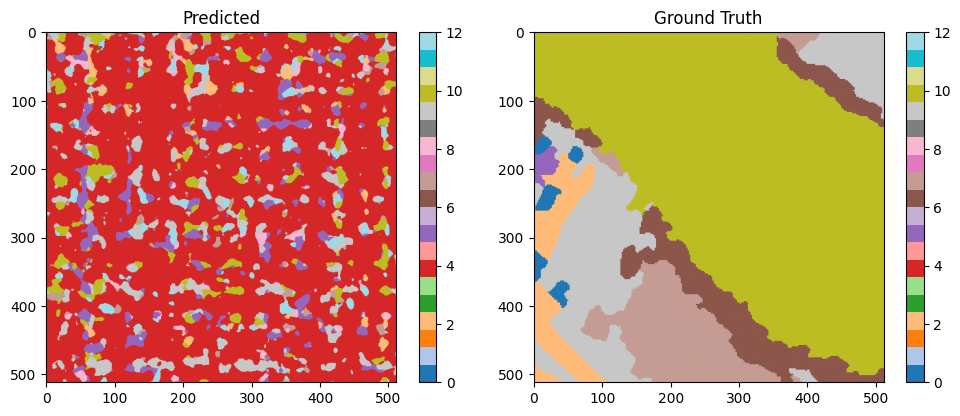

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 0, global step 1: 'val_IoU' reached 0.19916 (best 0.19916), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=00-val_IoU=0.1992.ckpt' as top 1


Unique predicted classes: tensor([ 2,  4,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


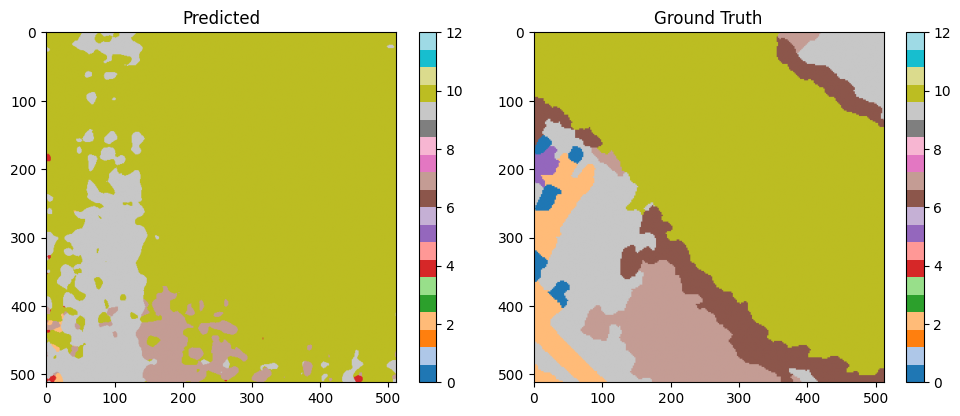

Validation: |          | 0/? [00:00<?, ?it/s]

/Users/hugoriffaud/Documents/FLAIR_Ato/training/trainer.py:139: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.log("log train_loss", torch.log(torch.tensor(loss)), on_step=False, on_epoch=True, logger=True, sync_dist=True)
Epoch 1, global step 2: 'val_IoU' reached 0.20274 (best 0.20274), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=01-val_IoU=0.2027.ckpt' as top 1


Unique predicted classes: tensor([ 2,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


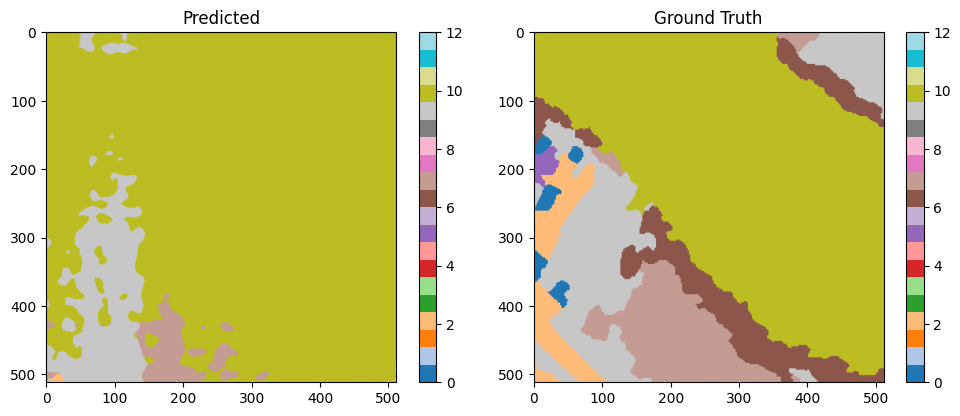

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 2, global step 3: 'val_IoU' was not in top 1


Unique predicted classes: tensor([ 2,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


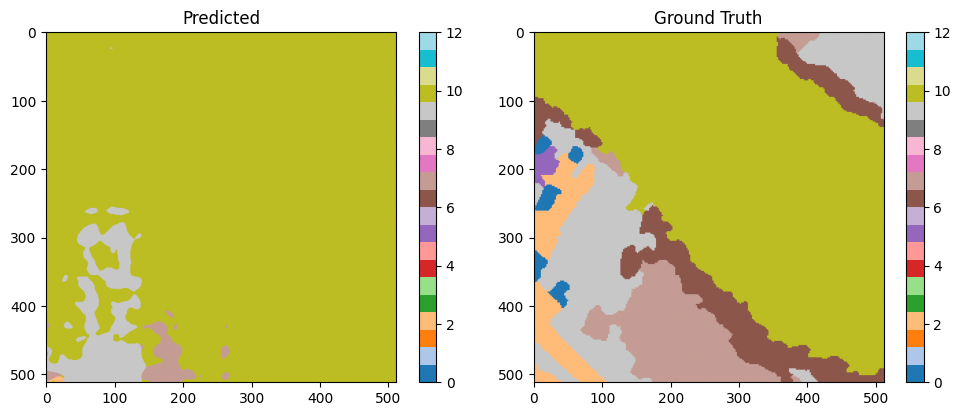

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 3, global step 4: 'val_IoU' was not in top 1


Unique predicted classes: tensor([ 2,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


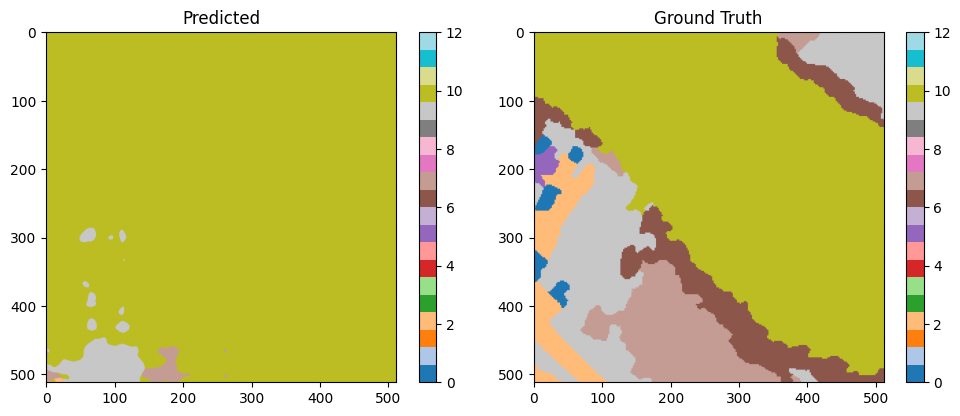

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 4, global step 5: 'val_IoU' was not in top 1


Unique predicted classes: tensor([ 2,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


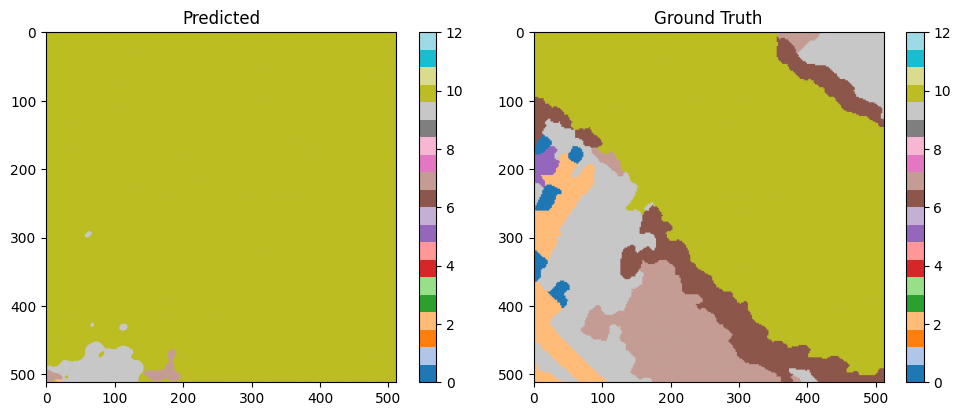

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 6: 'val_IoU' was not in top 1


Unique predicted classes: tensor([ 2,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


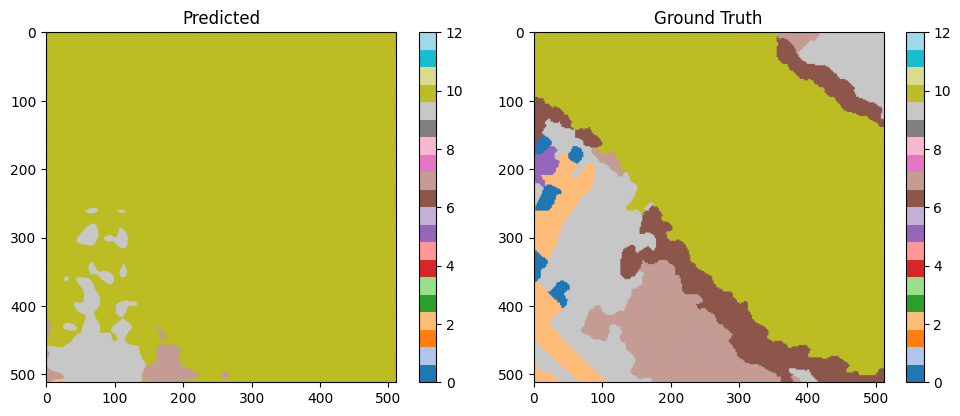

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 6, global step 7: 'val_IoU' reached 0.23899 (best 0.23899), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=06-val_IoU=0.2390.ckpt' as top 1


Unique predicted classes: tensor([ 2,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


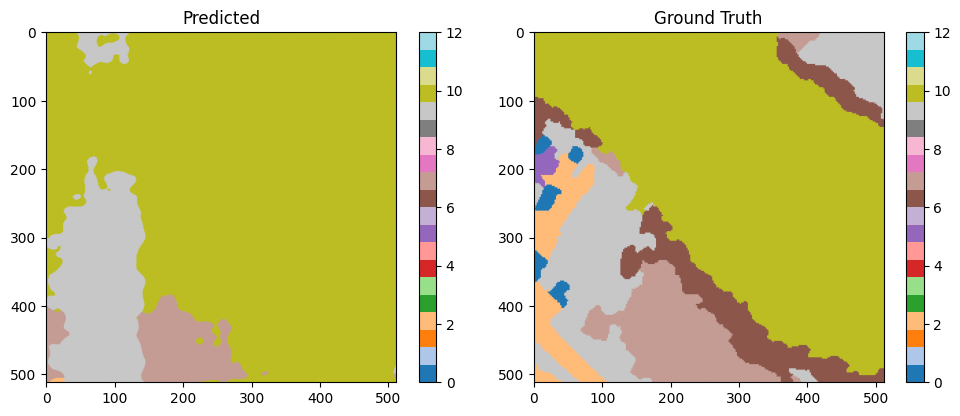

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 8: 'val_IoU' reached 0.28062 (best 0.28062), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=07-val_IoU=0.2806.ckpt' as top 1


Unique predicted classes: tensor([ 2,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


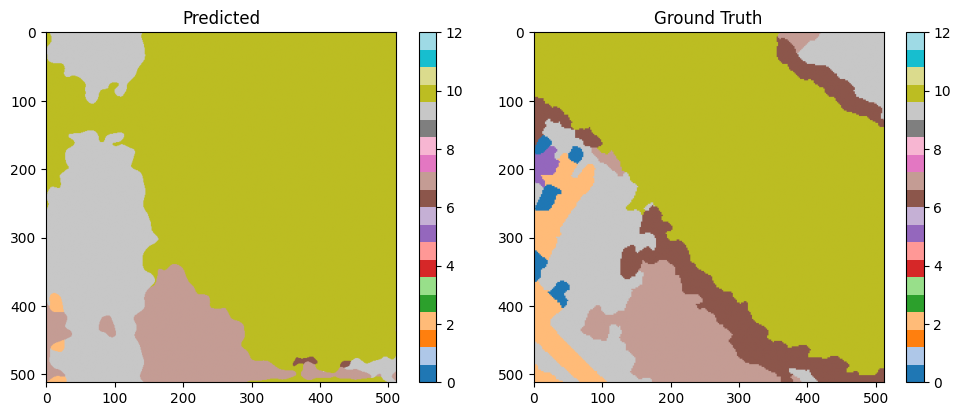

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 9: 'val_IoU' reached 0.30480 (best 0.30480), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=08-val_IoU=0.3048.ckpt' as top 1


Unique predicted classes: tensor([ 2,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


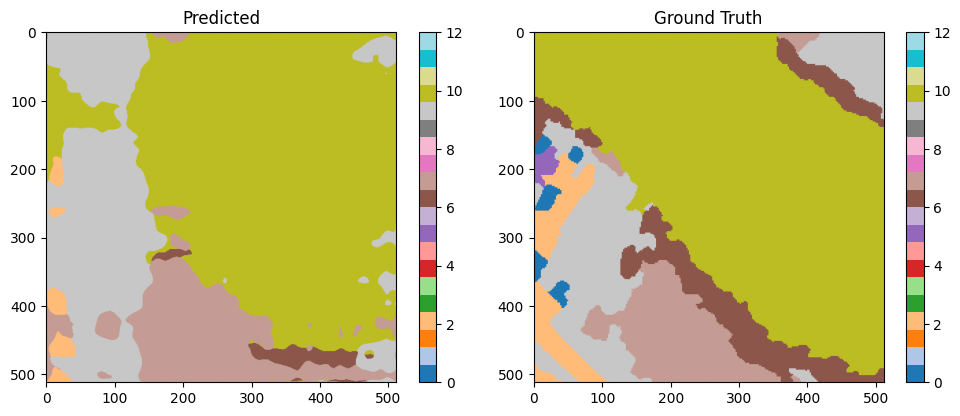

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 10: 'val_IoU' reached 0.36570 (best 0.36570), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=09-val_IoU=0.3657.ckpt' as top 1


Unique predicted classes: tensor([ 2,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


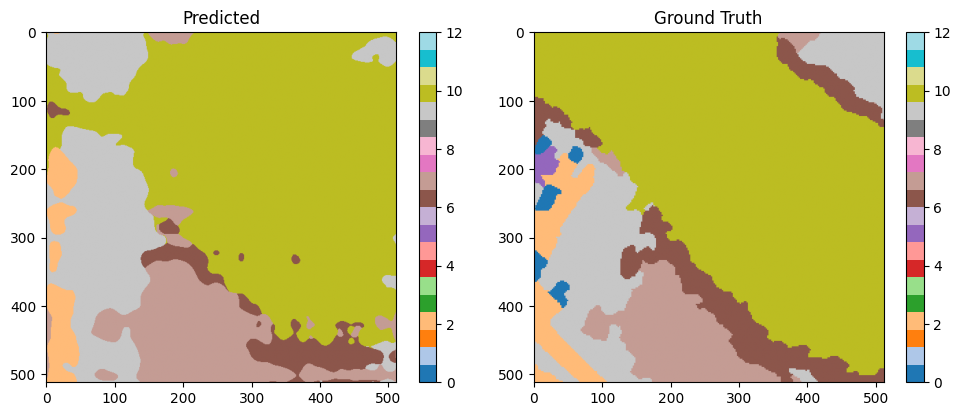

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 11: 'val_IoU' reached 0.41759 (best 0.41759), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=10-val_IoU=0.4176.ckpt' as top 1


Unique predicted classes: tensor([ 2,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


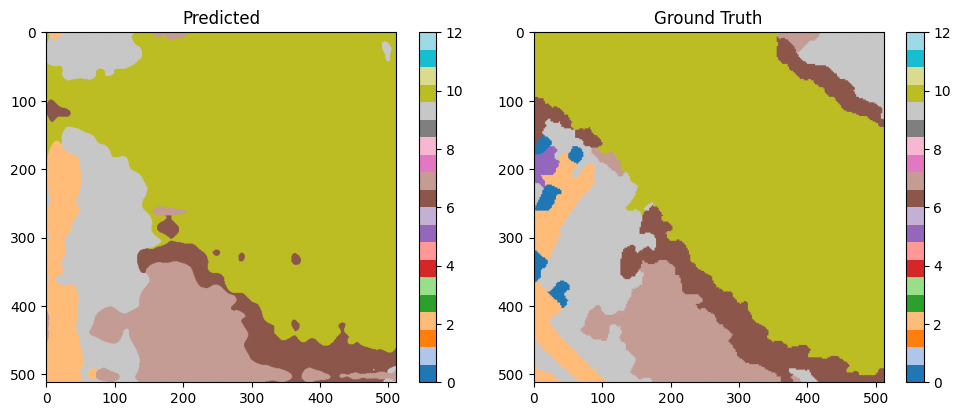

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 11, global step 12: 'val_IoU' reached 0.43850 (best 0.43850), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=11-val_IoU=0.4385.ckpt' as top 1


Unique predicted classes: tensor([ 2,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


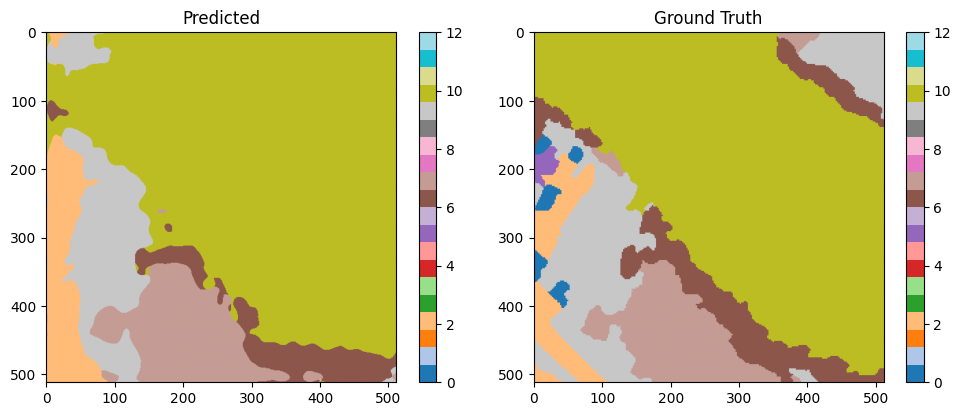

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 13: 'val_IoU' was not in top 1


Unique predicted classes: tensor([ 2,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


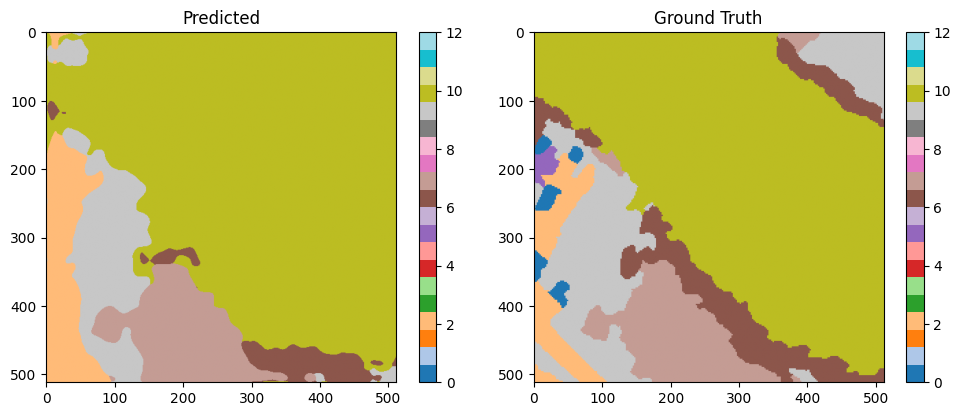

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 14: 'val_IoU' was not in top 1


Unique predicted classes: tensor([ 2,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


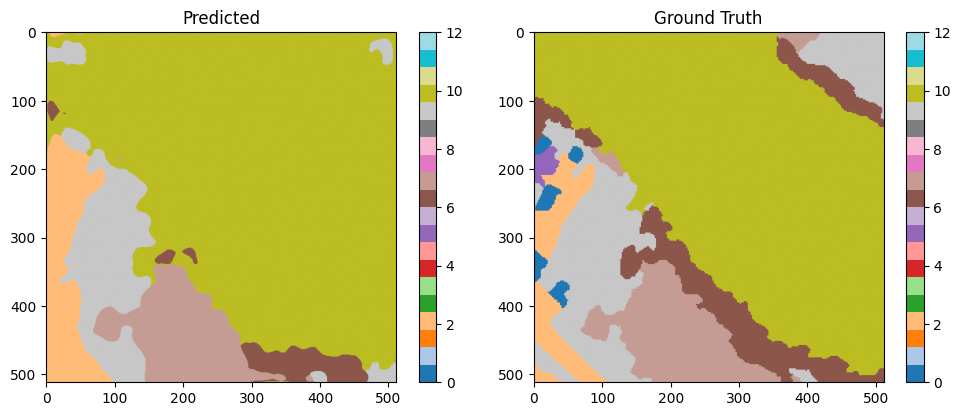

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 14, global step 15: 'val_IoU' reached 0.46869 (best 0.46869), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=14-val_IoU=0.4687.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


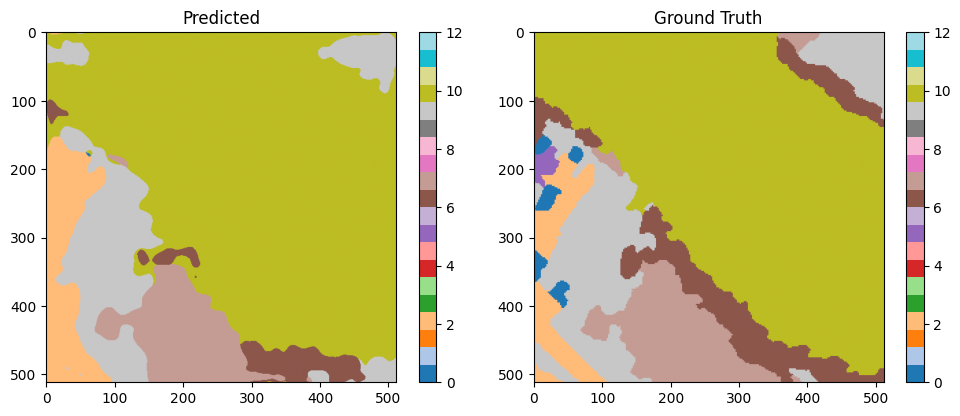

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 15, global step 16: 'val_IoU' reached 0.51922 (best 0.51922), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=15-val_IoU=0.5192.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


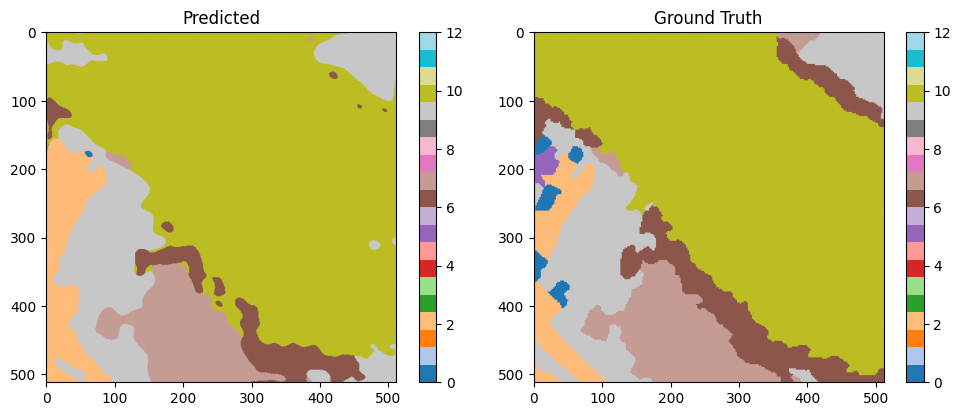

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 16, global step 17: 'val_IoU' reached 0.60814 (best 0.60814), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=16-val_IoU=0.6081.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


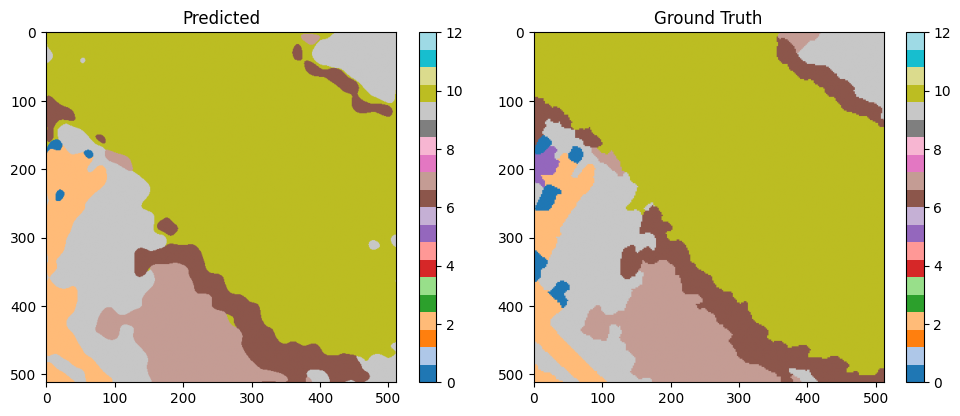

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 18: 'val_IoU' reached 0.67228 (best 0.67228), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=17-val_IoU=0.6723.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


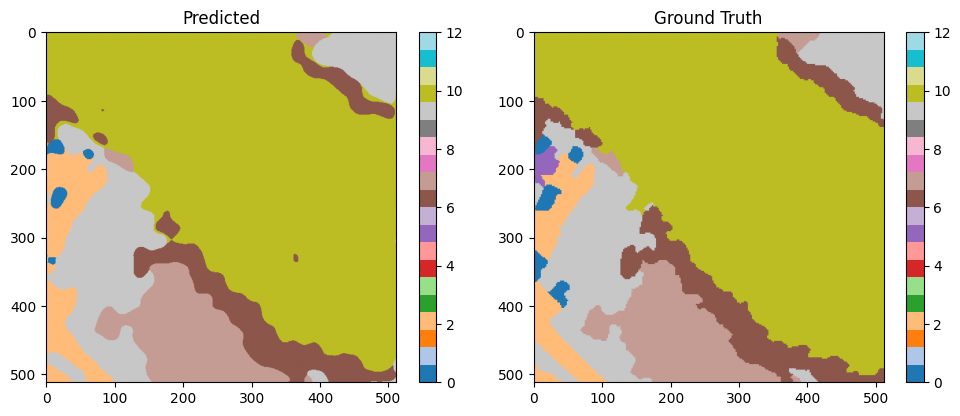

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 19: 'val_IoU' reached 0.70197 (best 0.70197), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=18-val_IoU=0.7020.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


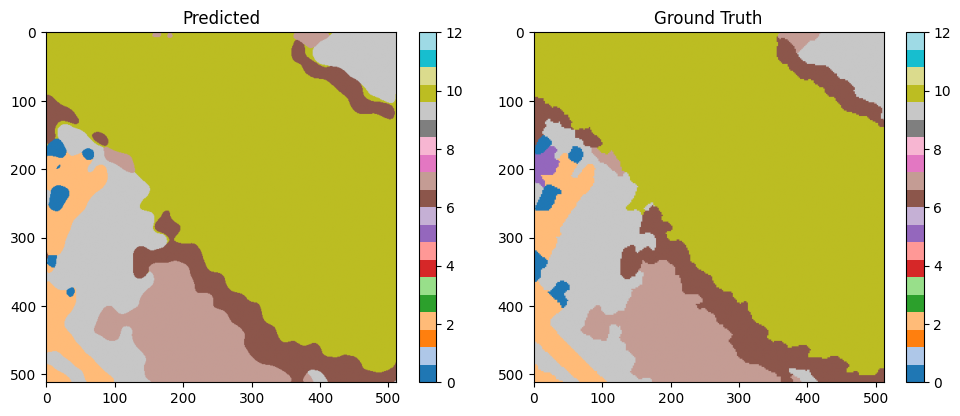

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 20: 'val_IoU' reached 0.70819 (best 0.70819), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=19-val_IoU=0.7082.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


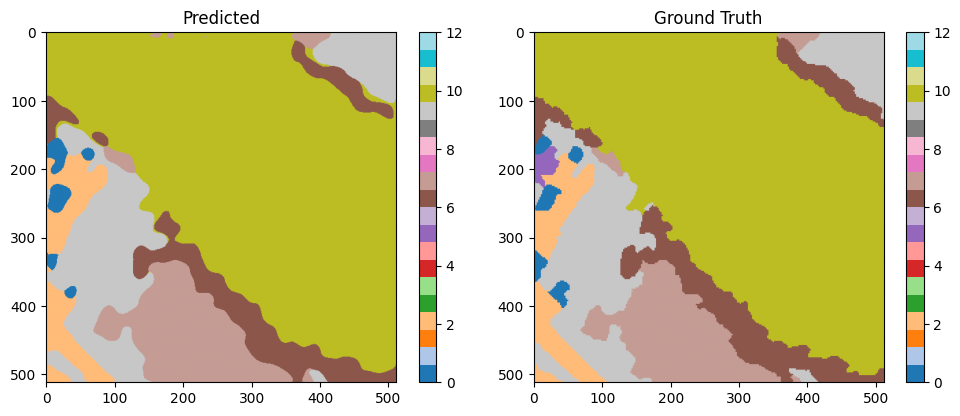

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 21: 'val_IoU' reached 0.71440 (best 0.71440), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=20-val_IoU=0.7144.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


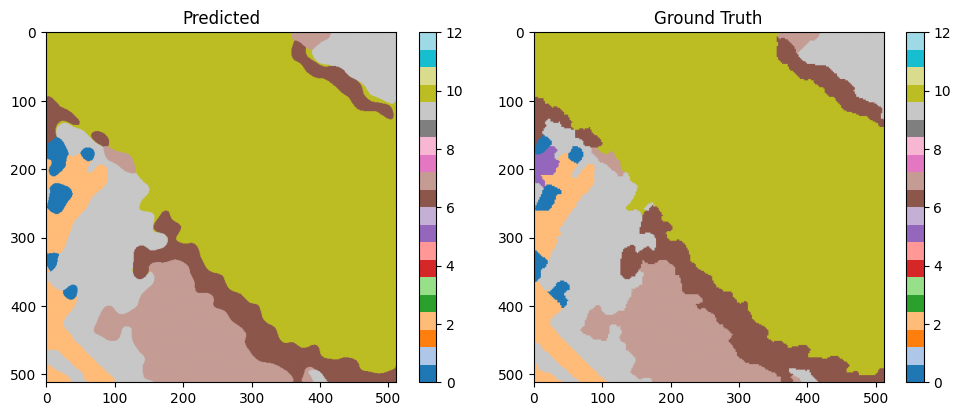

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 22: 'val_IoU' reached 0.77563 (best 0.77563), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=21-val_IoU=0.7756.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


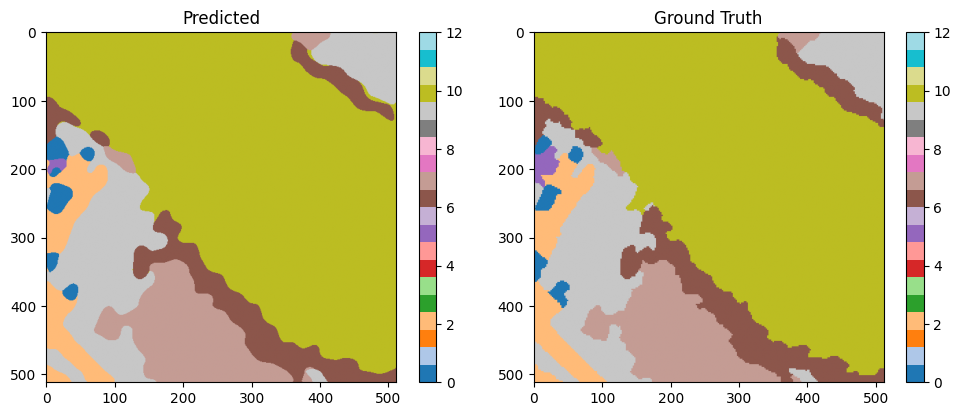

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 22, global step 23: 'val_IoU' reached 0.82847 (best 0.82847), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=22-val_IoU=0.8285.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


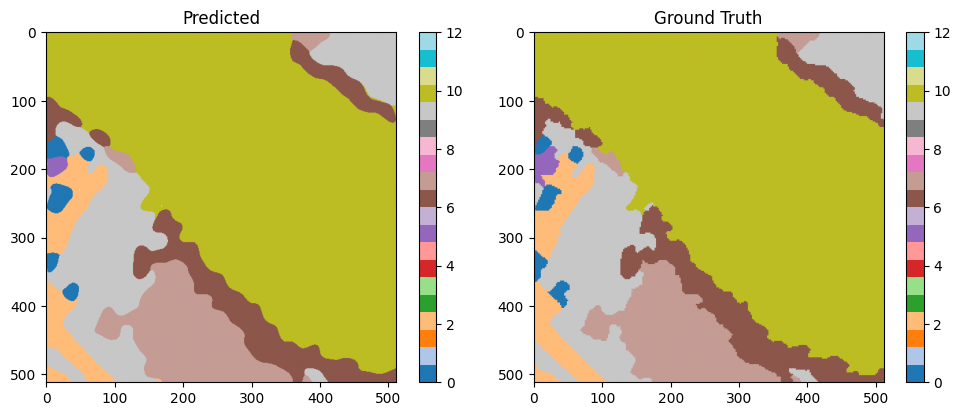

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 24: 'val_IoU' reached 0.85322 (best 0.85322), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=23-val_IoU=0.8532.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


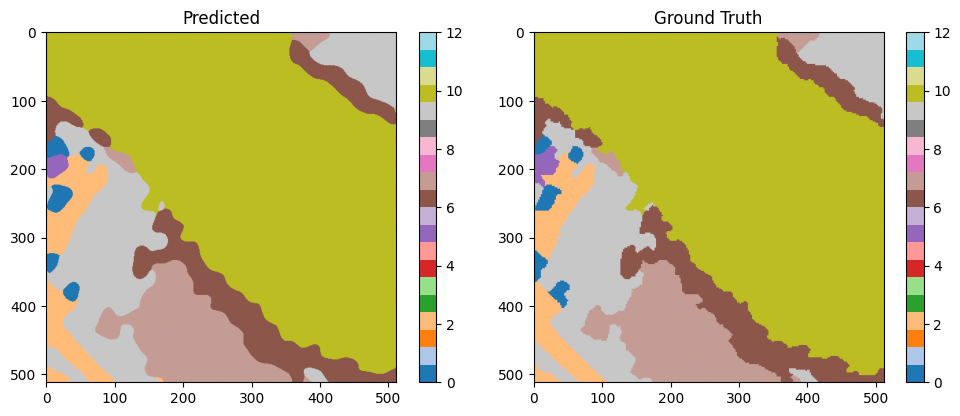

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 24, global step 25: 'val_IoU' reached 0.86987 (best 0.86987), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=24-val_IoU=0.8699.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


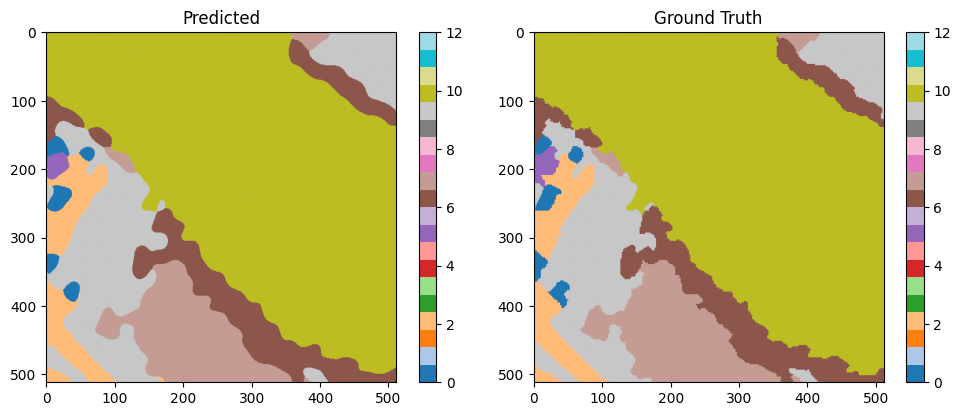

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 25, global step 26: 'val_IoU' reached 0.88257 (best 0.88257), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=25-val_IoU=0.8826.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


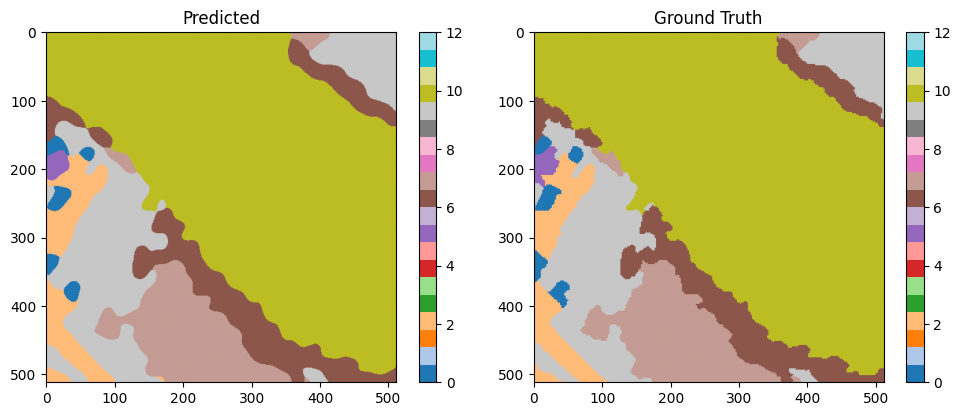

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 27: 'val_IoU' reached 0.89110 (best 0.89110), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=26-val_IoU=0.8911.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


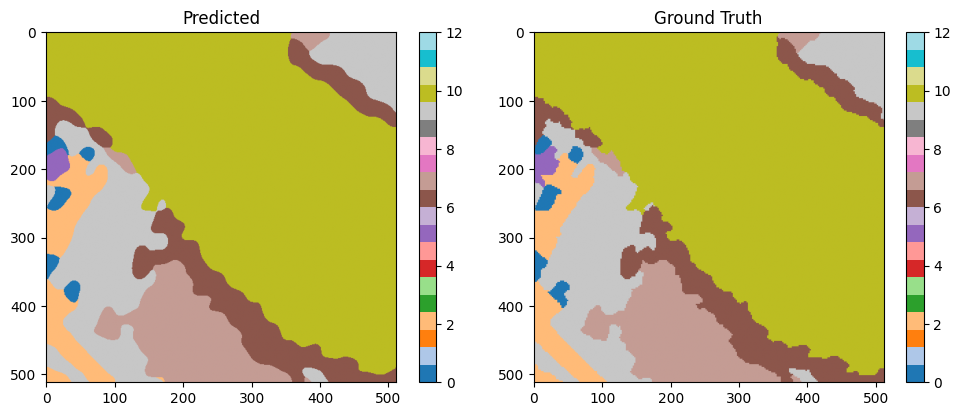

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 28: 'val_IoU' reached 0.89869 (best 0.89869), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=27-val_IoU=0.8987.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


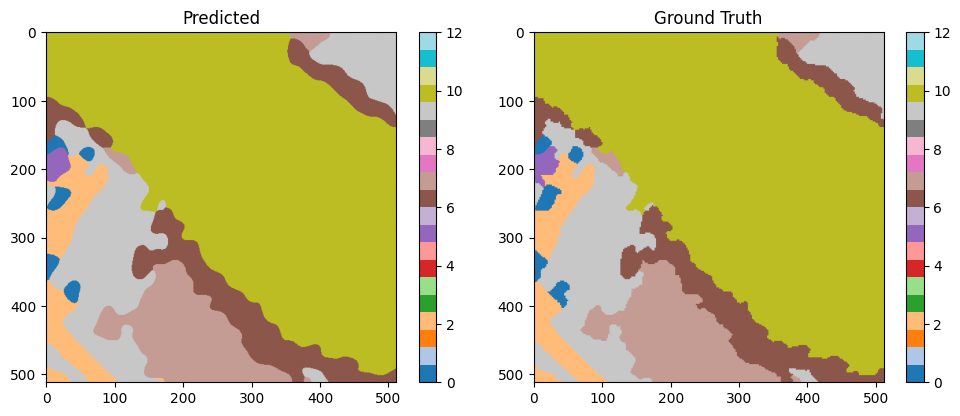

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 29: 'val_IoU' reached 0.90465 (best 0.90465), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=28-val_IoU=0.9047.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


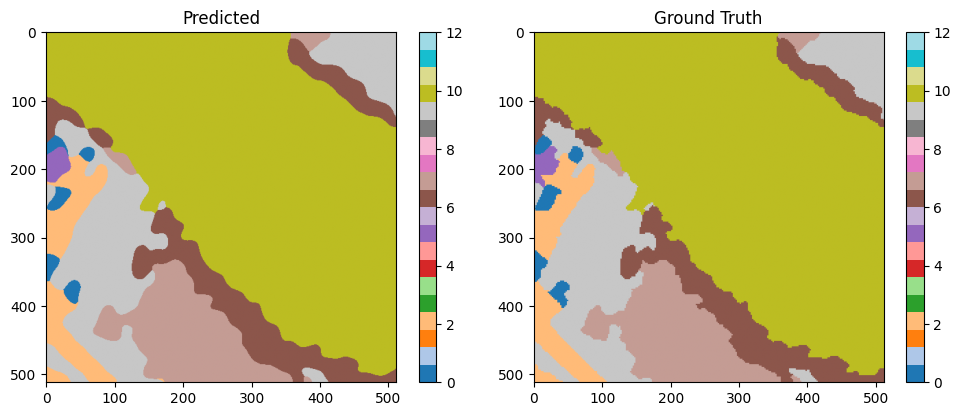

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 30: 'val_IoU' reached 0.91037 (best 0.91037), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=29-val_IoU=0.9104.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


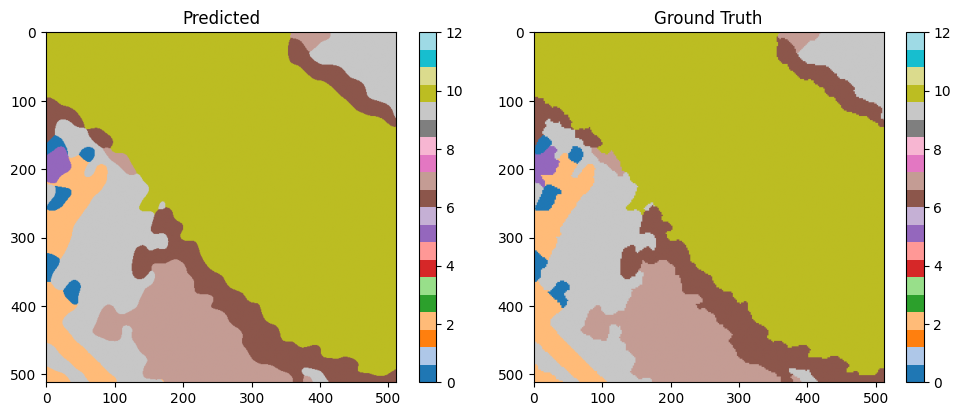

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 30, global step 31: 'val_IoU' reached 0.91410 (best 0.91410), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=30-val_IoU=0.9141.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


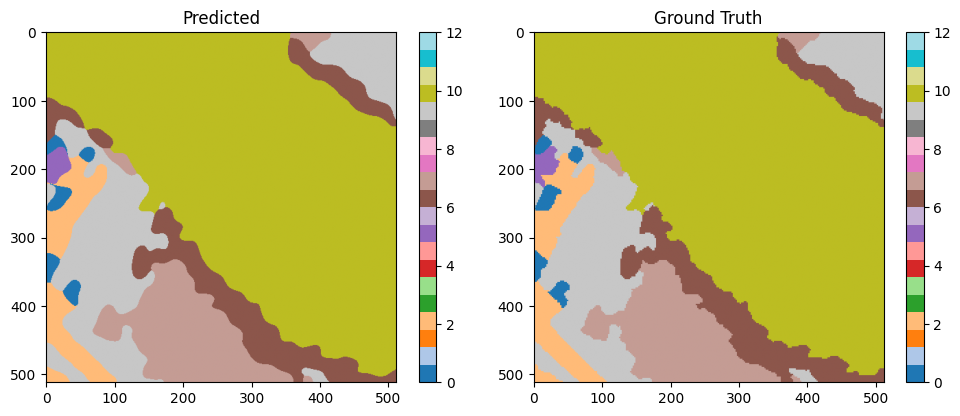

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 31, global step 32: 'val_IoU' reached 0.91677 (best 0.91677), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=31-val_IoU=0.9168.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


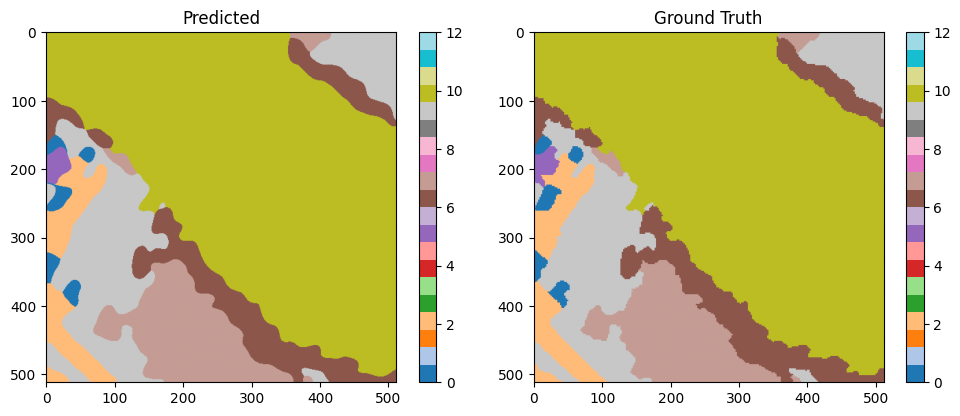

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 32, global step 33: 'val_IoU' reached 0.92001 (best 0.92001), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=32-val_IoU=0.9200.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


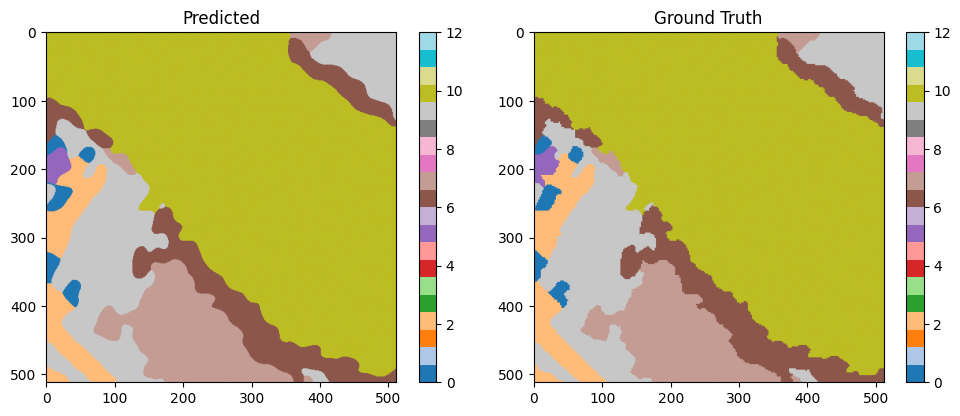

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 33, global step 34: 'val_IoU' reached 0.92316 (best 0.92316), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=33-val_IoU=0.9232.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


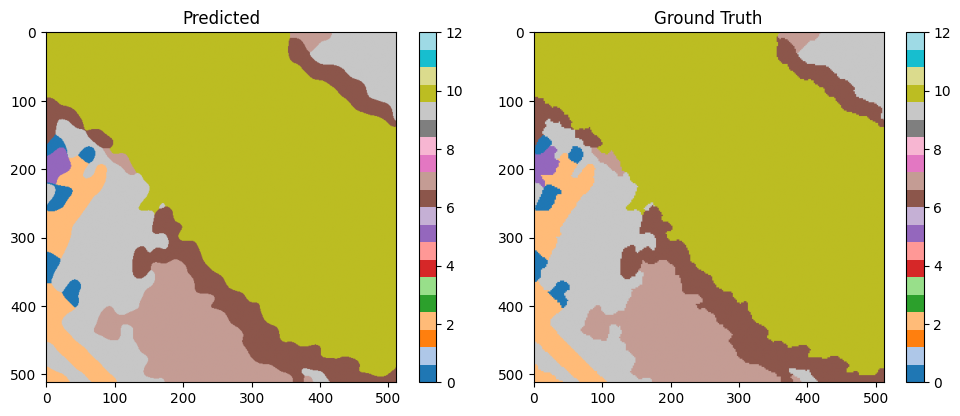

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 34, global step 35: 'val_IoU' reached 0.92537 (best 0.92537), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=34-val_IoU=0.9254.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


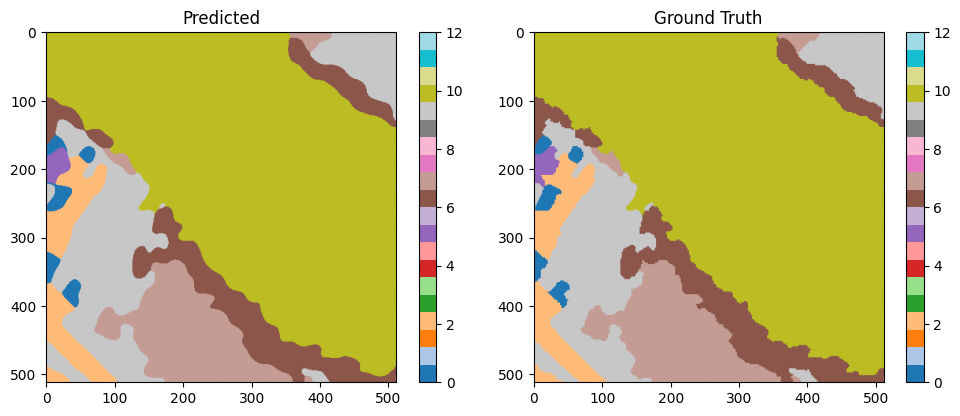

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 35, global step 36: 'val_IoU' reached 0.92817 (best 0.92817), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=35-val_IoU=0.9282.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


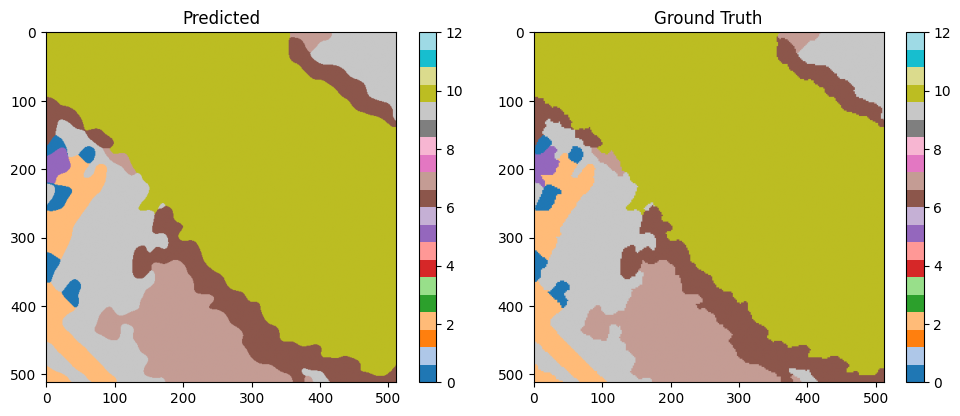

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 36, global step 37: 'val_IoU' reached 0.93004 (best 0.93004), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=36-val_IoU=0.9300.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


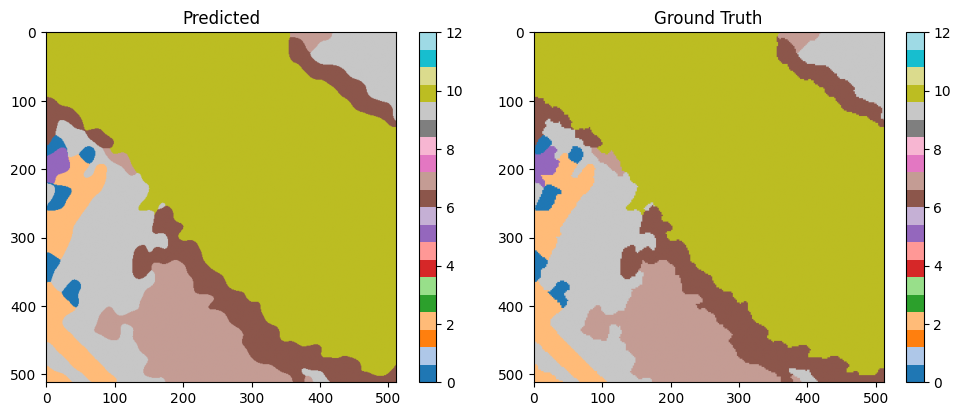

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 37, global step 38: 'val_IoU' reached 0.93188 (best 0.93188), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=37-val_IoU=0.9319.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


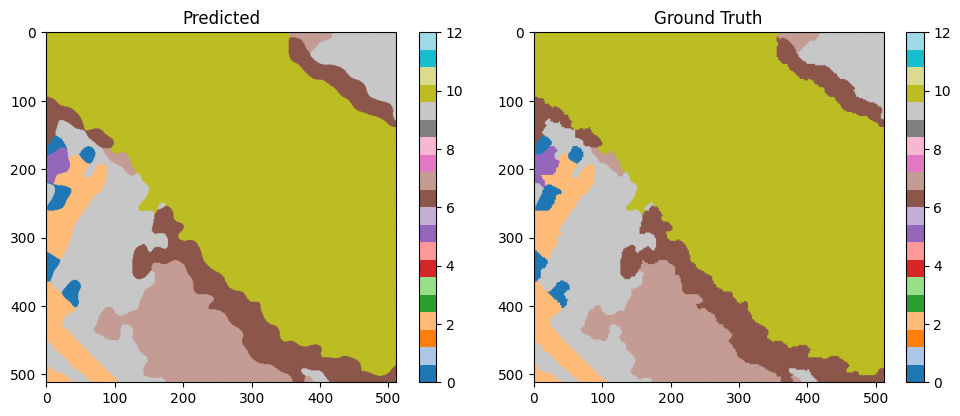

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 38, global step 39: 'val_IoU' reached 0.93524 (best 0.93524), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=38-val_IoU=0.9352.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


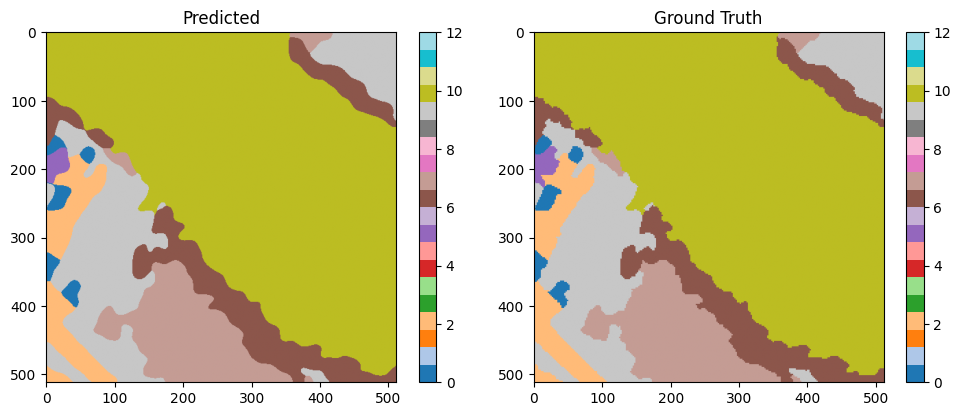

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 39, global step 40: 'val_IoU' reached 0.93710 (best 0.93710), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=39-val_IoU=0.9371.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


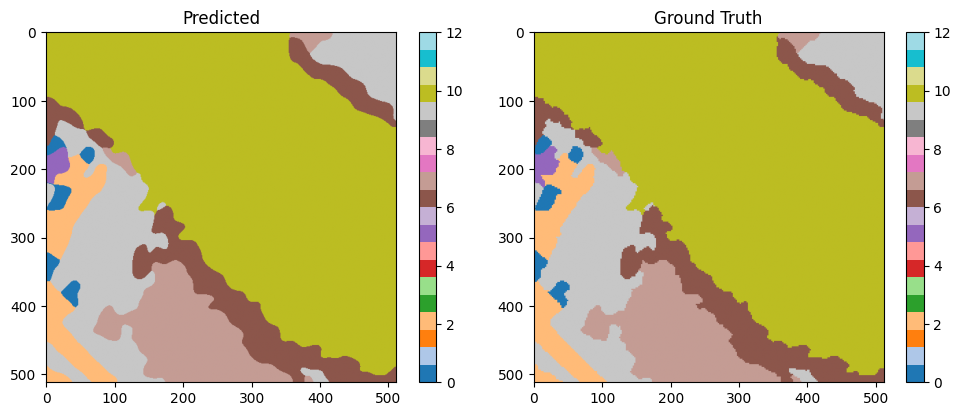

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 40, global step 41: 'val_IoU' reached 0.94009 (best 0.94009), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=40-val_IoU=0.9401.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


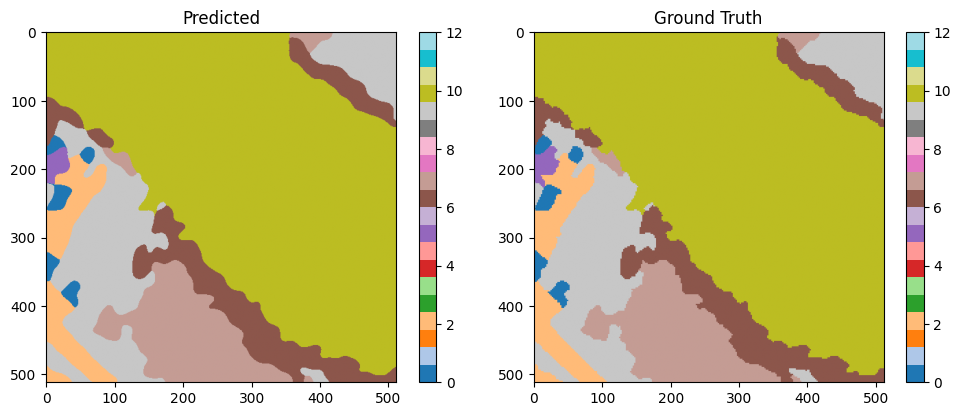

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 41, global step 42: 'val_IoU' reached 0.94156 (best 0.94156), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=41-val_IoU=0.9416.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


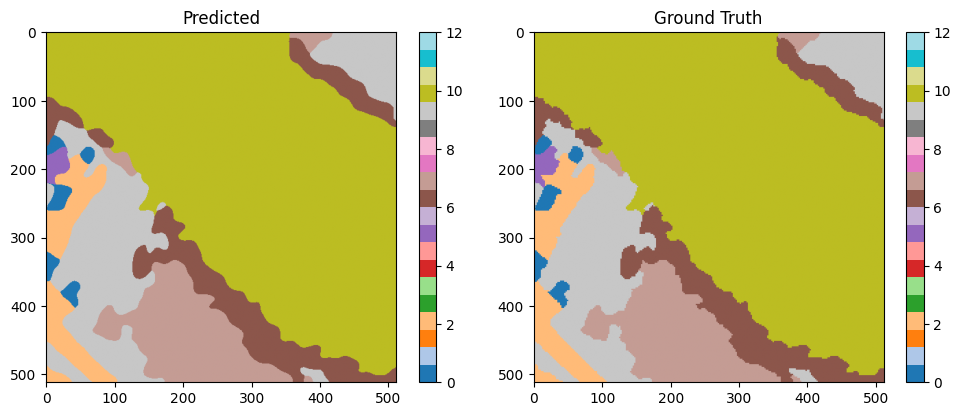

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 42, global step 43: 'val_IoU' reached 0.94500 (best 0.94500), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=42-val_IoU=0.9450.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


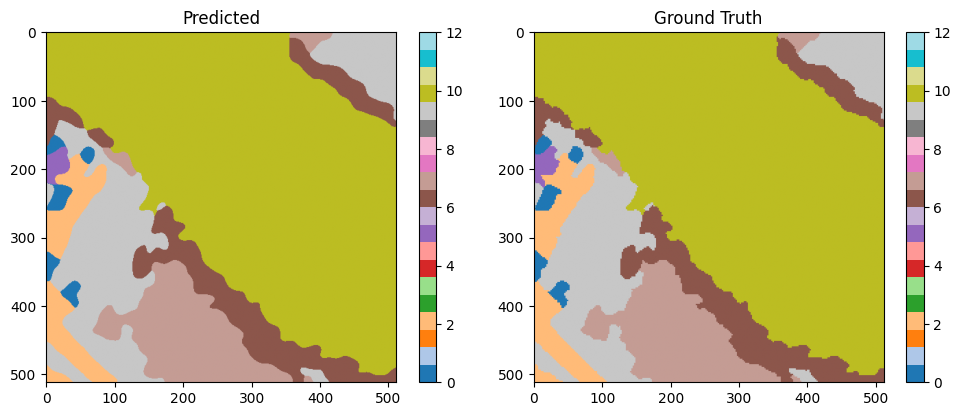

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 43, global step 44: 'val_IoU' reached 0.94687 (best 0.94687), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=43-val_IoU=0.9469.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


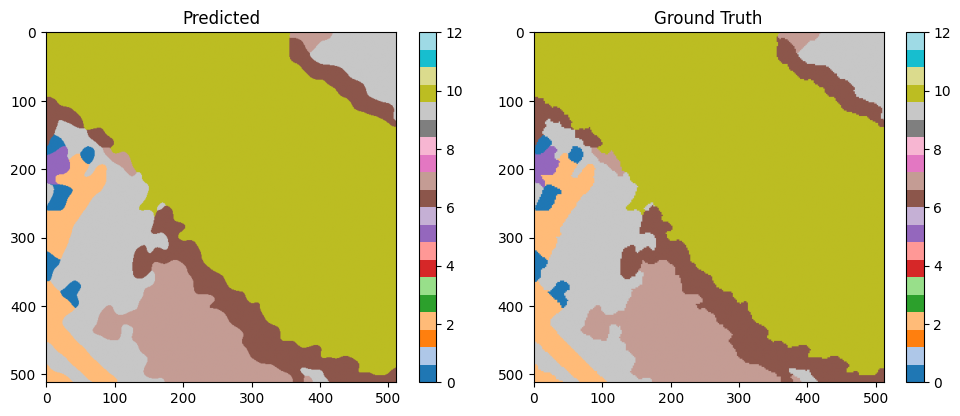

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 44, global step 45: 'val_IoU' reached 0.94914 (best 0.94914), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=44-val_IoU=0.9491.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


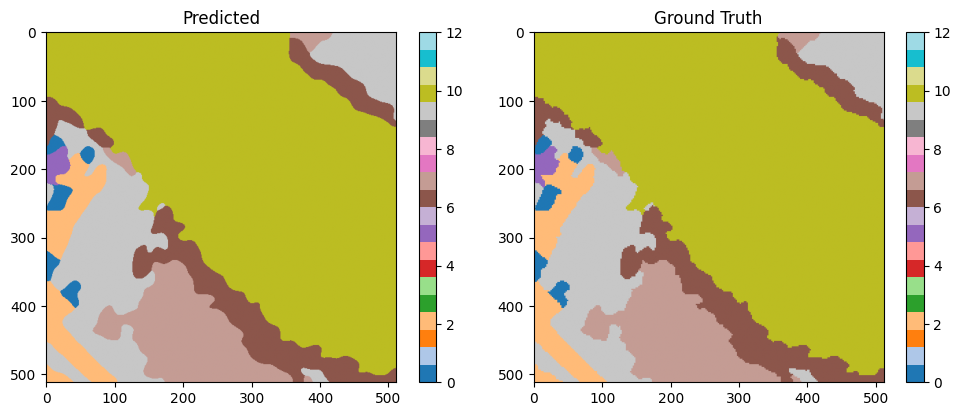

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 45, global step 46: 'val_IoU' reached 0.95043 (best 0.95043), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=45-val_IoU=0.9504.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


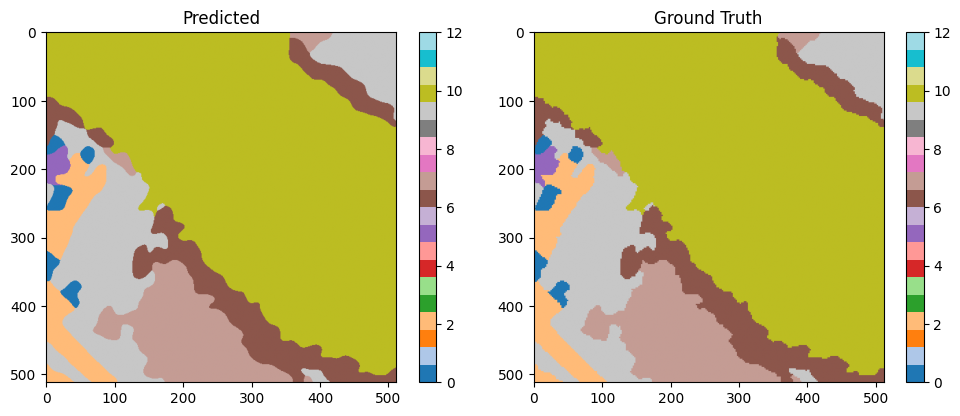

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 46, global step 47: 'val_IoU' reached 0.95155 (best 0.95155), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=46-val_IoU=0.9516.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


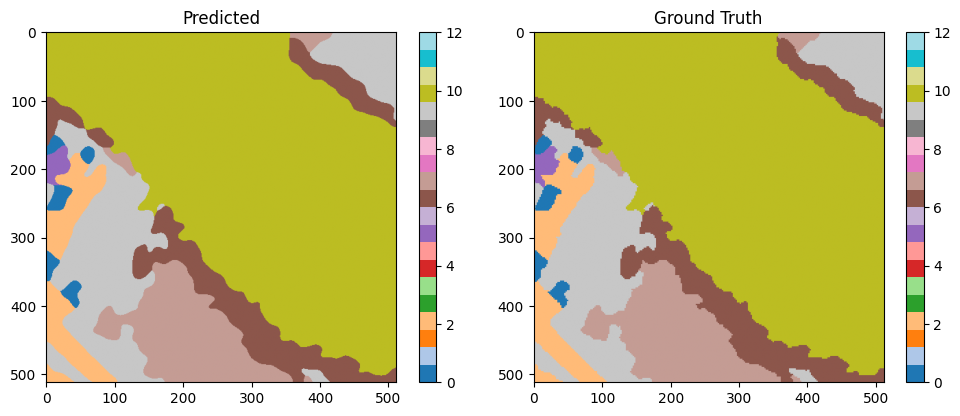

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 47, global step 48: 'val_IoU' reached 0.95308 (best 0.95308), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=47-val_IoU=0.9531.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


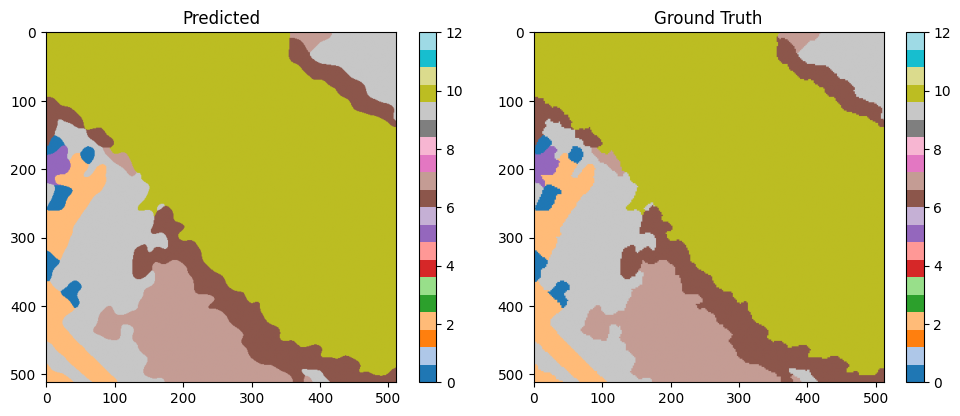

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 48, global step 49: 'val_IoU' reached 0.95367 (best 0.95367), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=48-val_IoU=0.9537.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


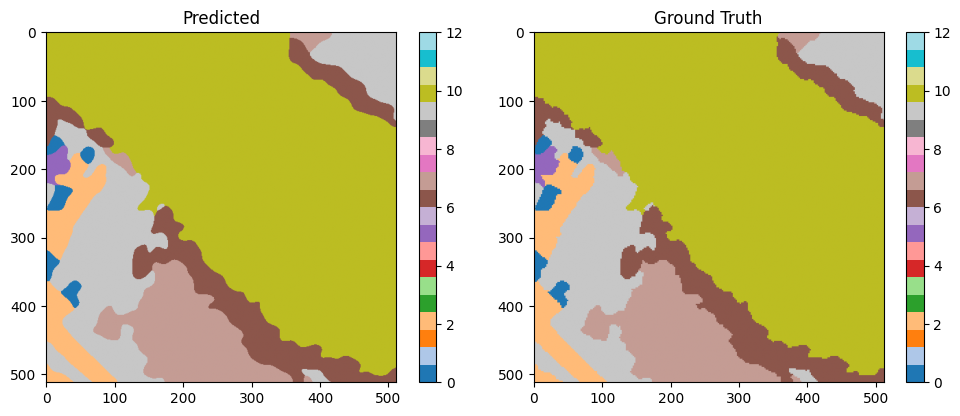

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 49, global step 50: 'val_IoU' reached 0.95504 (best 0.95504), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=49-val_IoU=0.9550.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


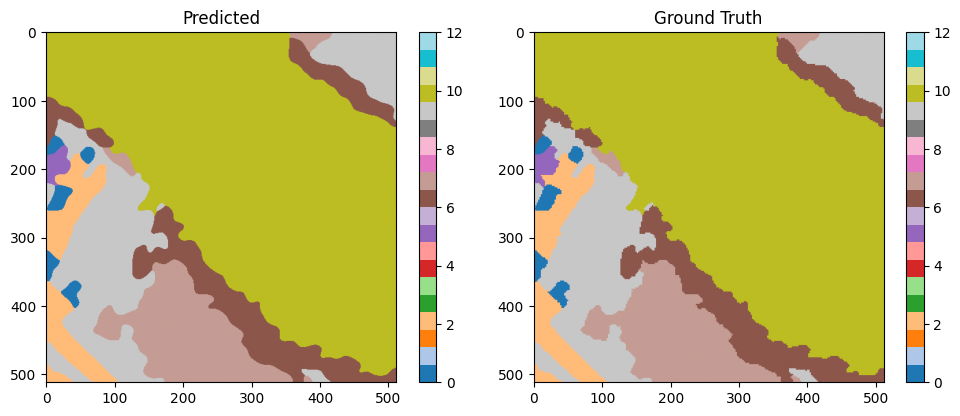

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 50, global step 51: 'val_IoU' reached 0.95627 (best 0.95627), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=50-val_IoU=0.9563.ckpt' as top 1


Unique predicted classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')
Unique true classes: tensor([ 0,  2,  5,  6,  7,  9, 10], device='mps:0')


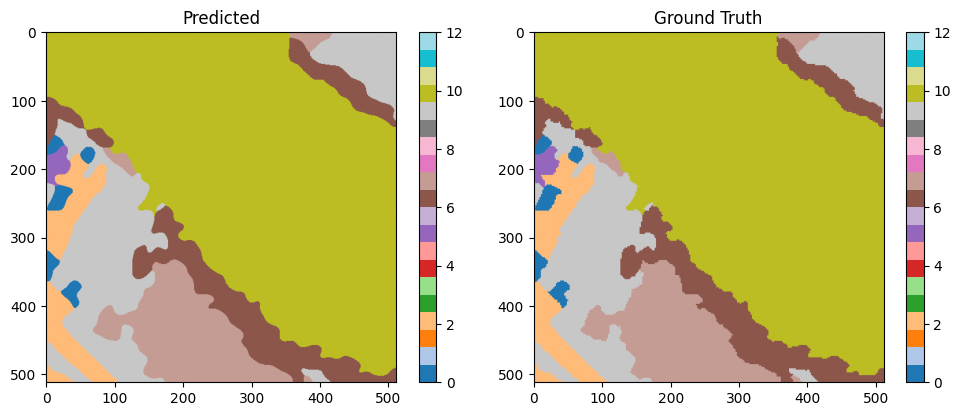

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 51, global step 52: 'val_IoU' reached 0.95734 (best 0.95734), saving model to '/Users/hugoriffaud/Documents/FLAIR_Ato/checkpoints/best_model-epoch=51-val_IoU=0.9573.ckpt' as top 1


In [ ]:
from pytorch_lightning import Trainer, seed_everything
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint
import torch
import os

seed_everything(42, workers=True)

torch.set_default_dtype(torch.float32)
torch.set_float32_matmul_precision('medium')

config_model = read_yaml("./training/configs/config_test-Atomiser_Atos.yaml")
labels = load_json_to_dict("./data/flair_2_toy_dataset/flair_labels.json")
bands_yaml = "./data/bands_info/bands.yaml"

trans_config = transformations_config_flair(bands_yaml, config_model)
xp_name = "test_Atos"

wand = False
wandb_logger = None
if wand:
    if os.environ.get("LOCAL_RANK", "0") == "0":
        import wandb
        wandb.init(
            name=get_xp_name(config_model['encoder']) + " modalities",
            project="Atos_modalities",
            config=config_model
        )
        wandb_logger = WandbLogger(project="tiny_modalities")

model = Model(config_model, wand=wand, name=xp_name, labels=labels)

data_module = CustomFlairDataModule(
    "./data/custom_flair/tiny",
    config=config_model,
    trans_config=trans_config,
    batch_size=config_model['dataset']['batchsize'],
)

data_module.setup()


# Callbacks
checkpoint_callback = ModelCheckpoint(
    dirpath="./checkpoints/",
    filename="best_model-{epoch:02d}-{val_IoU:.4f}",
    monitor="val_IoU",
    mode="max",
    save_top_k=1,
    verbose=True,
)

early_stop_callback = EarlyStopping(
    monitor="val_IoU",
    min_delta=0.00,
    patience=15,
    verbose=False,
    mode="max"
)



# Trainer
trainer = Trainer(
    use_distributed_sampler=False,
    #strategy="ddp",
    #devices=-1,
    max_epochs=config_model["trainer"]["epochs"],
    logger=wandb_logger,
    log_every_n_steps=1,
    accelerator="gpu",
    callbacks=[early_stop_callback, checkpoint_callback],
    default_root_dir="./checkpoints/"
)


# Fit the model
trainer.fit(model, datamodule=data_module)


In [ ]:
def fourier_encode(x, max_freq, num_bands = 4):
    x = x.unsqueeze(-1)
    device, dtype, orig_x = x.device, x.dtype, x

    if num_bands==-1:
        scales = torch.linspace(1., max_freq , max_freq, device = device, dtype = dtype)
    else:
        scales = torch.linspace(1., max_freq / 2, num_bands, device = device, dtype = dtype)

    #scales shape: [num_bands]
    scales = scales[(*((None,) * (len(x.shape) - 1)), Ellipsis)]
    #scales shape: [len(orig_x.shape),]

    x = x * scales * pi
        
    x = torch.cat([x.sin(), x.cos()], dim = -1)
    x = torch.cat((x, orig_x), dim = -1)
    return x

def pos_encoding(size,positional_scaling=None,max_freq=4,num_bands = 4):
        if positional_scaling==None:
            axis_pos = list(map(lambda size: torch.linspace(-1., 1., steps=size), (size,size)))
        else:
            axis_pos = list(map(lambda size: torch.linspace(-positional_scaling/2.0, positional_scaling/2.0, steps=size), (size,size)))
        pos = torch.stack(torch.meshgrid(*axis_pos, indexing = 'ij'), dim = -1)
        
        pos=fourier_encode(pos,max_freq=max_freq,num_bands = num_bands)
        return pos[:,:,0,:],pos[:,:,1,:]

def get_positional_processing(size,resolution,max_freq,num_bands):

        positional_scaling=None
        if resolution!=None:
            positional_scaling=(size * resolution)/400.0

   
        

        encoding_x_s,encoding_y_s=pos_encoding(size,positional_scaling=positional_scaling,max_freq=max_freq,num_bands = num_bands)
        
        res=torch.stack((encoding_x_s,encoding_y_s),dim=-1)
        res=einops.rearrange(res,"h w c s -> (c s) h w")
      
        return res


In [ ]:
test_tensor=get_positional_processing(512,None,4,64)
test_tensor=einops.rearrange(test_tensor,"f h w -> (h w) f")